In [1]:
import gym
class CustomEnv(gym.Env):
    def __init__(self, df):
        super(CustomEnv, self).__init__()
        self.df = df
        self.reward_range = (-np.inf, np.inf)
        self.action_space = gym.spaces.Discrete(df['discrete_action'].nunique())
        self.observation_space = gym.spaces.Box(low=-np.inf, high=np.inf, shape=(df.shape[1]-1,))

    def reset(self):
        self.current_step = 0
        self.done = False
        self.total_rewards = 0
        return self.df.iloc[self.current_step, :-1].values

    def step(self, action):
        self.current_step += 1
        if self.current_step >= len(self.df):
            self.done = True

        self.reward = self.df.iloc[self.current_step, -1]
        self.total_rewards += self.reward
        self.state = self.df.iloc[self.current_step, :-1].values

        return self.state, self.reward, self.done, {}


In [2]:
import pandas as pd
import umap.umap_ as umap
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from tqdm.notebook import tqdm
# Function to define rewards
def define_rewards(df):
    rewards = df['bloc'].replace({0: 0, 1: 15, 2: -15, 3: 0})
    df['reward'] = rewards
    return df

# Load training dataset
train_df = pd.read_csv('C:/Users/logik/Desktop/rlsepsis234-master - full/data/train_state_action_reward_df.csv')
val_df = pd.read_csv('C:/Users/logik/Desktop/rlsepsis234-master - full/data/test_state_action_reward_df.csv')
test_df = pd.read_csv('C:/Users/logik/Desktop/rlsepsis234-master - full/data/predictions_100.csv')

# Define the columns to keep
columns_to_keep = ['Admn001_ID', 'bloc', 'Vitl009_SOFA', 'SpO2', 'Temp_C',
       'GCS', 'Demo002_Age', 'Demo004_Elixhauser score',
                   'Demo005_Weight_kg', 'Vitl002_HR', 'Vitl003_SysBP', 'Vitl004_MeanBP', 'Vitl005_DiaBP', 'Vitl006_RR',
                   'Labs001_Potassium', 'Labs002_sodium', 'Labs008_Ca', 'Labs014_Albumin', 'Labs015_Hb', 'Labs021_pH',
                   'Labs024_BE', 'Labs025_HCO3', 'Vitl011_Shock_Index', 'Flud006_Cumulated fluid balance', 'Labs005_BUN',
                   'Labs006_Creatinine', 'Labs013_TotalBili', 'Labs016_WbcCount', 'Labs017_PlateletsCount',
                   'Labs027_PaO2_FiO2 ratio', 'Labs023_PaCO2', 'Labs026_Lactate', 'Flud001_InputTotal', 'Flud004_OutputTotal',
                   'Flud005_Output4H', 'Demo001_Gender_0', 'Demo001_Gender_1', 'Vent003_sedation_0', 'Vent003_sedation_1',
                   'Flud007_rrt_0', 'Flud007_rrt_1', 'Vent001_Mech_0', 'Vent001_Mech_1', 'Vitl010_SIRS_1', 'Vitl010_SIRS_2',
                   'Vitl010_SIRS_3', 'Vitl010_SIRS_4', 'Vitl010_SIRS_5', 'vaso_input', 'iv_input', 'discrete_action', 'reward']

# Apply the rewards to the test data
test_df = define_rewards(test_df)

# Adjust the columns of the dataframes
train_df = train_df[columns_to_keep]
val_df = val_df[columns_to_keep]
test_df = test_df[columns_to_keep]
# Remove 'discrete_action', 'reward', 'vaso_input', and 'iv_input' before dimensionality reduction
train_data_to_reduce = train_df.drop(['discrete_action', 'reward', 'vaso_input', 'iv_input', 'Vitl009_SOFA', 'SpO2', 'Temp_C', 'GCS'], axis=1)
test_data_to_reduce = test_df.drop(['discrete_action', 'reward', 'vaso_input', 'iv_input', 'Vitl009_SOFA', 'SpO2', 'Temp_C', 'GCS'], axis=1)

# Apply UMAP to reduce dimensionality of the data
reducer = umap.UMAP(n_neighbors=50, min_dist=0.5, random_state=2023, verbose=True)
train_data_umap = reducer.fit_transform(train_data_to_reduce)
test_data_umap = reducer.transform(test_data_to_reduce)

# Add 'discrete_action', 'reward', 'vaso_input', and 'iv_input' back to the UMAP-reduced data
train_df_umap = pd.DataFrame(train_data_umap, columns=["UMAP1", "UMAP2"])
train_df_umap['discrete_action'] = train_df['discrete_action']
train_df_umap['reward'] = train_df['reward']
train_df_umap['vaso_input'] = train_df['vaso_input']
train_df_umap['iv_input'] = train_df['iv_input']
train_df_umap['Vitl009_SOFA'] = train_df['Vitl009_SOFA']
train_df_umap['SpO2'] = train_df['SpO2']
train_df_umap['Temp_C'] = train_df['Temp_C']
train_df_umap['GCS'] = train_df['GCS']

test_df_umap = pd.DataFrame(test_data_umap, columns=["UMAP1", "UMAP2"])
test_df_umap['discrete_action'] = test_df['discrete_action']
test_df_umap['reward'] = test_df['reward']
test_df_umap['vaso_input'] = test_df['vaso_input']
test_df_umap['iv_input'] = test_df['iv_input']
test_df_umap['Vitl009_SOFA'] = test_df['Vitl009_SOFA']
test_df_umap['SpO2'] = test_df['SpO2']
test_df_umap['Temp_C'] = test_df['Temp_C']
test_df_umap['GCS'] = test_df['GCS']


UMAP(min_dist=0.5, n_neighbors=50, random_state=2023, verbose=True)
Sat Aug  5 11:05:57 2023 Construct fuzzy simplicial set
Sat Aug  5 11:05:57 2023 Finding Nearest Neighbors
Sat Aug  5 11:05:57 2023 Building RP forest with 49 trees
Sat Aug  5 11:06:04 2023 NN descent for 20 iterations
	 1  /  20
	 2  /  20
	Stopping threshold met -- exiting after 2 iterations
Sat Aug  5 11:08:06 2023 Finished Nearest Neighbor Search
Sat Aug  5 11:08:15 2023 Construct embedding


C:\ProgramData\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:274: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Epochs completed:   0%|            0/200 [00:00]

Sat Aug  5 11:20:28 2023 Finished embedding
Sat Aug  5 11:21:44 2023 Worst tree score: 0.99934160
Sat Aug  5 11:21:44 2023 Mean tree score: 0.99940790
Sat Aug  5 11:21:44 2023 Best tree score: 0.99945831
Sat Aug  5 11:21:49 2023 Forward diversification reduced edges from 39413500 to 3429099
Sat Aug  5 11:21:51 2023 Reverse diversification reduced edges from 3429099 to 3429099
Sat Aug  5 11:21:53 2023 Degree pruning reduced edges from 2865314 to 2865314
Sat Aug  5 11:21:53 2023 Resorting data and graph based on tree order
Sat Aug  5 11:21:54 2023 Building and compiling search function


Epochs completed:   0%|            0/100 [00:00]

In [13]:
mse_dict = {}  # 初始化字典

for column in tqdm(train_df.columns, desc="Processing columns"):

    # 跳过不需要的列
    if column in ['discrete_action', 'reward', 'vaso_input', 'iv_input','Vitl009_SOFA', 'SpO2', 'Temp_C', 'GCS']:
        continue

    # 获取目标列
    target = train_df[column]

    # 为了能够进行回归模型训练，我们需要将目标列从原始数据中去除
    train_df_reduced = train_df.drop(columns=[column])

    # 将数据划分为训练集和测试集
    X_train, X_test, y_train, y_test = train_test_split(train_data_umap, target, test_size=0.2, random_state=42)

    # 使用随机森林进行回归
    regressor = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
    regressor.fit(X_train, y_train)

    # 对测试集进行预测
    predictions = regressor.predict(X_test)

    # 计算预测结果和实际结果之间的均方误差
    mse = mean_squared_error(y_test, predictions)

    # 保存MSE到字典
    mse_dict[column] = mse

# 打印每个特征的MSE
for column, mse in mse_dict.items():
    print(f'MSE for {column}: {mse}')


Processing columns:   0%|          | 0/52 [00:00<?, ?it/s]

MSE for Admn001_ID: 28662067.842116967
MSE for bloc: 94.60479321171681
MSE for Vitl009_SOFA: 1.1321667556801602
MSE for SpO2: 1.1047547616933284
MSE for Temp_C: 1.0559777265403987
MSE for GCS: 0.5731682678523856
MSE for Demo002_Age: 0.03801779809999447
MSE for Demo004_Elixhauser score: 0.017596093744943395
MSE for Demo005_Weight_kg: 0.005638543434300869
MSE for Vitl002_HR: 0.005562244115163643
MSE for Vitl003_SysBP: 0.0053665721830936635
MSE for Vitl004_MeanBP: 0.004876107855388425
MSE for Vitl005_DiaBP: 0.0028885922805440404
MSE for Vitl006_RR: 0.004897419698474565
MSE for Labs001_Potassium: 0.002141426478176755
MSE for Labs002_sodium: 0.0026679067315559437
MSE for Labs008_Ca: 0.0012992954726584846
MSE for Labs014_Albumin: 0.012873124789969995
MSE for Labs015_Hb: 0.004581480942617841
MSE for Labs021_pH: 0.0037633970105149703
MSE for Labs024_BE: 0.0049127782556657555
MSE for Labs025_HCO3: 0.005099529260330386
MSE for Vitl011_Shock_Index: 0.003203119317853417
MSE for Flud006_Cumulated f

Epochs: 100%|██████████| 10/10 [08:36<00:00, 51.65s/it, Last Loss=0.0547]


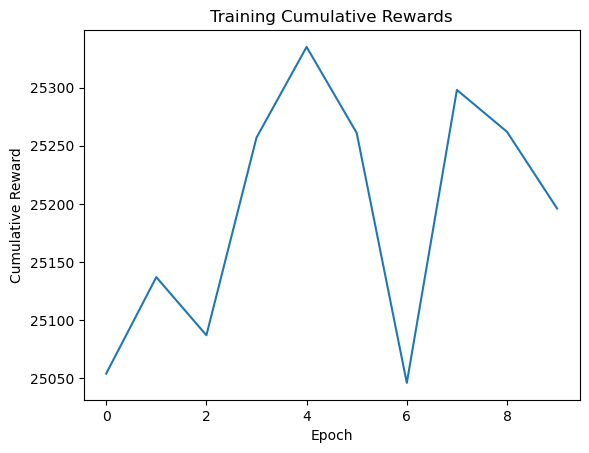

In [36]:
# DQN
import numpy as np
import tensorflow as tf
class DQN(tf.keras.Model):
    def __init__(self, num_actions):
        super(DQN, self).__init__()
        self.dense1 = tf.keras.layers.Dense(128, activation='relu')
        self.dense2 = tf.keras.layers.Dense(64, activation='relu')
        self.dense3 = tf.keras.layers.Dense(num_actions)

    def call(self, x):
        x = self.dense1(x)
        x = self.dense2(x)
        return self.dense3(x)

class ReplayBuffer:
    def __init__(self, capacity):
        self.capacity = capacity
        self.buffer = []
        self.position = 0

    def add(self, state, action, reward, next_state, done):
        if len(self.buffer) < self.capacity:
            self.buffer.append(None)
        self.buffer[self.position] = (state, action, reward, next_state, done)
        self.position = (self.position + 1) % self.capacity

    def sample(self, batch_size):
        actual_batch_size = min(batch_size, len(self.buffer))
        batch = random.sample(self.buffer, actual_batch_size)
        state, action, reward, next_state, done = map(np.stack, zip(*batch))
        return state, action, reward, next_state, done


    def __len__(self):
        return len(self.buffer)

# Extract data from dataframes
states_train = train_df_umap.drop(['discrete_action', 'reward'], axis=1).values
actions_train = train_df_umap['discrete_action'].values
rewards_train = train_df_umap['reward'].values

# Hyperparameters
lr = 1e-3
batch_size = 256
epsilon = 0.1

# Model and Optimizer
model = DQN(np.unique(actions_train).shape[0])
optimizer = tf.keras.optimizers.Adam(lr)

buffer = ReplayBuffer(10000)

# Populate buffer with initial experiences
for state, action, reward in zip(states_train, actions_train, rewards_train):
    next_state = np.zeros_like(state)  # dummy value for simplicity
    done = False  # dummy value for simplicity
    buffer.add(state, action, reward, next_state, done)

# Training loop
num_epochs = 10
total_steps = len(states_train) // batch_size
cumulative_rewards = []

# Progress bar for epochs
pbar_epoch = tqdm(range(num_epochs), desc='Epochs', leave=True)

for epoch in pbar_epoch:
    epoch_cumulative_reward = 0

    # Progress bar for batches
    pbar_batch = tqdm(range(0, len(states_train), batch_size), desc='Batches', leave=False)

    for i in pbar_batch:
        # Sample batch from buffer
        state_batch, action_batch, reward_batch, next_state_batch, done_batch = buffer.sample(batch_size)

        with tf.GradientTape() as tape:
            q_values = model(state_batch)
            q_values = tf.reduce_sum(q_values * tf.one_hot(action_batch, depth=q_values.shape[1]), axis=1)
            target = reward_batch  # in a real setting, compute proper Q-learning target here
            loss = tf.reduce_mean(tf.square(target - q_values))

        grads = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(grads, model.trainable_variables))

        epoch_cumulative_reward += np.sum(reward_batch)

    cumulative_rewards.append(epoch_cumulative_reward)
    pbar_epoch.set_postfix({'Last Loss': loss.numpy()})

# Plot cumulative rewards
import matplotlib.pyplot as plt

plt.plot(cumulative_rewards)
plt.xlabel('Epoch')
plt.ylabel('Cumulative Reward')
plt.title('Training Cumulative Rewards')
plt.show()

# Function to get optimal action for a state
def get_optimal_action(state):
    q_values = model(state[None, :])
    return np.argmax(q_values.numpy())

# Apply on test set
test_states = test_df_umap.drop(['discrete_action', 'reward'], axis=1).values
optimal_actions_test = [get_optimal_action(state) for state in test_states]


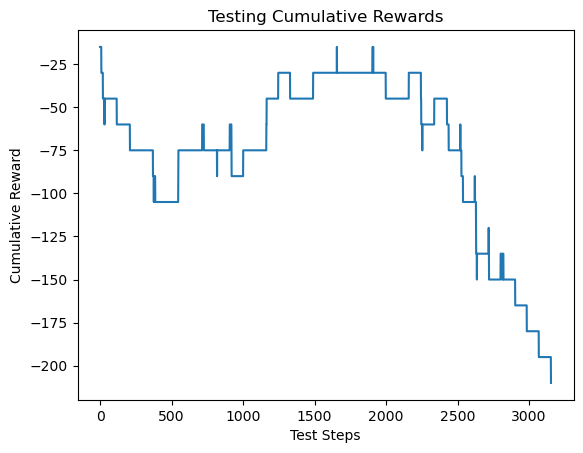

In [37]:
test_rewards = test_df_umap['reward'].values

# Assuming the test rewards correspond directly to the optimal actions you're taking.
cumulative_rewards_test = np.cumsum(test_rewards)

# Plot the cumulative rewards on the test set
import matplotlib.pyplot as plt

plt.plot(cumulative_rewards_test)
plt.xlabel('Test Steps')
plt.ylabel('Cumulative Reward')
plt.title('Testing Cumulative Rewards')
plt.show()


Epochs: 100%|██████████| 10/10 [14:30<00:00, 87.09s/it, Last Loss=0.629]


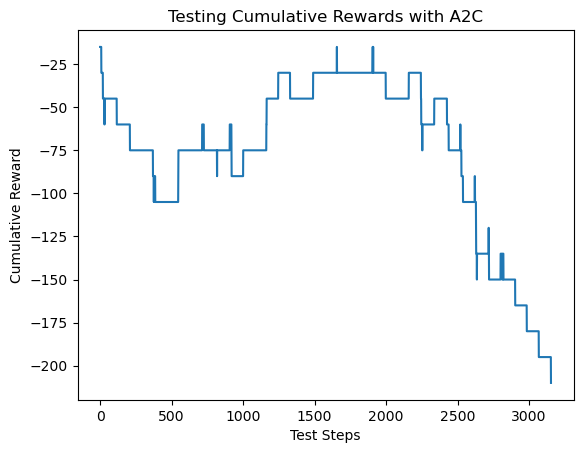

In [42]:
# A2C Model Definition
class A2C(tf.keras.Model):
    def __init__(self, num_actions):
        super(A2C, self).__init__()

        self.common_dense1 = tf.keras.layers.Dense(128, activation='relu')
        self.common_dense2 = tf.keras.layers.Dense(64, activation='relu')

        # Actor
        self.actor_dense = tf.keras.layers.Dense(num_actions, activation='softmax')

        # Critic
        self.critic_dense = tf.keras.layers.Dense(1)

    def call(self, x):
        x = self.common_dense1(x)
        x = self.common_dense2(x)

        policy = self.actor_dense(x)
        value  = self.critic_dense(x)

        return policy, value

# Model and Optimizer Initialization
model = A2C(np.unique(actions_train).shape[0])
optimizer = tf.keras.optimizers.Adam(lr)

# Training Loop
num_epochs = 10
cumulative_rewards = []

# Progress bar for epochs
from tqdm import tqdm
pbar_epoch = tqdm(range(num_epochs), desc='Epochs', leave=True)

for epoch in pbar_epoch:
    epoch_cumulative_reward = 0

    # Progress bar for batches
    pbar_batch = tqdm(range(0, len(states_train), batch_size), desc='Batches', leave=False)

    for i in pbar_batch:
        # Sample batch from buffer
        state_batch, action_batch, reward_batch, next_state_batch, done_batch = buffer.sample(batch_size)

        with tf.GradientTape() as tape:
            policies, values = model(state_batch)
            selected_prob = tf.reduce_sum(policies * tf.one_hot(action_batch, depth=policies.shape[1]), axis=1)
            target_values = model(next_state_batch)[1]

            # Calculate advantage and critic loss
            advantage = reward_batch + (1 - done_batch) * target_values - values
            critic_loss = tf.reduce_mean(tf.square(advantage))

            # Calculate actor loss
            actor_loss = -tf.reduce_mean(tf.math.log(selected_prob + 1e-10) * tf.stop_gradient(advantage))

            loss = actor_loss + critic_loss

        grads = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(grads, model.trainable_variables))

        epoch_cumulative_reward += np.sum(reward_batch)

    cumulative_rewards.append(epoch_cumulative_reward)
    pbar_epoch.set_postfix({'Last Loss': loss.numpy()})

# Applying the trained A2C model to the test set
test_states = test_df_umap.drop(['discrete_action', 'reward'], axis=1).values
test_rewards = test_df_umap['reward'].values

def get_optimal_action_a2c(state):
    policy, _ = model(state[None, :])
    return np.argmax(policy.numpy())

optimal_actions_test = [get_optimal_action_a2c(state) for state in test_states]

# Accumulate rewards based on the actions taken by the model on the test set
cumulative_rewards_test = np.cumsum(test_rewards)

# Plot the cumulative rewards on the test set
import matplotlib.pyplot as plt

plt.plot(cumulative_rewards_test)
plt.xlabel('Test Steps')
plt.ylabel('Cumulative Reward')
plt.title('Testing Cumulative Rewards with A2C')
plt.show()


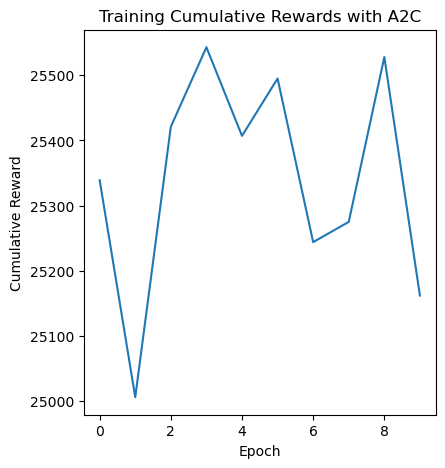

In [43]:
# ... [Previous A2C code here]

# Plot training cumulative rewards
plt.figure(figsize=(10,5))

# Plot for training rewards
plt.subplot(1, 2, 1)
plt.plot(cumulative_rewards)
plt.xlabel('Epoch')
plt.ylabel('Cumulative Reward')
plt.title('Training Cumulative Rewards with A2C')

# ... [Code for testing cumulative rewards as above]

plt.show()


In [38]:
# A3C
class A3C(tf.keras.Model):
    def __init__(self, num_actions):
        super(A3C, self).__init__()

        self.common_dense1 = tf.keras.layers.Dense(128, activation='relu')
        self.common_dense2 = tf.keras.layers.Dense(64, activation='relu')

        # Actor
        self.actor_dense = tf.keras.layers.Dense(num_actions, activation='softmax')

        # Critic
        self.critic_dense = tf.keras.layers.Dense(1)

    def call(self, x):
        x = self.common_dense1(x)
        x = self.common_dense2(x)

        policy = self.actor_dense(x)
        value  = self.critic_dense(x)

        return policy, value

# Model and Optimizer
model = A3C(np.unique(actions_train).shape[0])
optimizer = tf.keras.optimizers.Adam(lr)

# ... [其他代码保持不变]

for epoch in pbar_epoch:
    epoch_cumulative_reward = 0

    # Progress bar for batches
    pbar_batch = tqdm(range(0, len(states_train), batch_size), desc='Batches', leave=False)

    for i in pbar_batch:
        # Sample batch from buffer
        state_batch, action_batch, reward_batch, next_state_batch, done_batch = buffer.sample(batch_size)

        with tf.GradientTape() as tape:
            policies, values = model(state_batch)
            selected_prob = tf.reduce_sum(policies * tf.one_hot(action_batch, depth=policies.shape[1]), axis=1)
            target_values = model(next_state_batch)[1]

            # Calculate advantage and critic loss
            advantage = reward_batch + (1 - done_batch) * target_values - values
            critic_loss = tf.reduce_mean(tf.square(advantage))

            # Calculate actor loss
            actor_loss = -tf.reduce_mean(tf.math.log(selected_prob + 1e-10) * tf.stop_gradient(advantage))

            loss = actor_loss + critic_loss

        grads = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(grads, model.trainable_variables))

        epoch_cumulative_reward += np.sum(reward_batch)

    cumulative_rewards.append(epoch_cumulative_reward)
    pbar_epoch.set_postfix({'Last Loss': loss.numpy()})
# Model and Optimizer
model = A3C(np.unique(actions_train).shape[0])
optimizer = tf.keras.optimizers.Adam(lr)

# Populate buffer with initial experiences
for state, action, reward in zip(states_train, actions_train, rewards_train):
    next_state = np.zeros_like(state)  # dummy value for simplicity
    done = False  # dummy value for simplicity
    buffer.add(state, action, reward, next_state, done)

# Training loop
num_epochs = 10
total_steps = len(states_train) // batch_size
cumulative_rewards = []

# Progress bar for epochs
pbar_epoch = tqdm(range(num_epochs), desc='Epochs', leave=True)

for epoch in pbar_epoch:
    epoch_cumulative_reward = 0

    # Progress bar for batches
    pbar_batch = tqdm(range(0, len(states_train), batch_size), desc='Batches', leave=False)

    for i in pbar_batch:
        # Sample batch from buffer
        state_batch, action_batch, reward_batch, next_state_batch, done_batch = buffer.sample(batch_size)

        with tf.GradientTape() as tape:
            policies, values = model(state_batch)
            selected_prob = tf.reduce_sum(policies * tf.one_hot(action_batch, depth=policies.shape[1]), axis=1)
            target_values = model(next_state_batch)[1]

            # Calculate advantage and critic loss
            advantage = reward_batch + (1 - done_batch) * target_values - values
            critic_loss = tf.reduce_mean(tf.square(advantage))

            # Calculate actor loss
            actor_loss = -tf.reduce_mean(tf.math.log(selected_prob + 1e-10) * tf.stop_gradient(advantage))

            loss = actor_loss + critic_loss

        grads = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(grads, model.trainable_variables))

        epoch_cumulative_reward += np.sum(reward_batch)

    cumulative_rewards.append(epoch_cumulative_reward)
    pbar_epoch.set_postfix({'Last Loss': loss.numpy()})


Epochs: 100%|██████████| 10/10 [14:28<00:00, 86.83s/it, Last Loss=0.564]


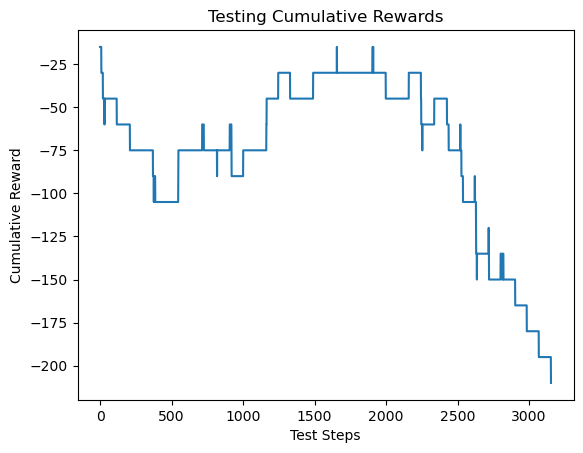

In [39]:
def get_optimal_action(state):
    policy, _ = model(state[None, :])
    return np.argmax(policy.numpy())

test_rewards = test_df_umap['reward'].values
cumulative_rewards_test = [np.sum(test_rewards[:i+1]) for i in range(len(test_rewards))]

# 绘制累计奖励
import matplotlib.pyplot as plt

plt.plot(cumulative_rewards_test)
plt.xlabel('Test Steps')
plt.ylabel('Cumulative Reward')
plt.title('Testing Cumulative Rewards')
plt.show()


Epochs: 100%|██████████| 10/10 [16:39<00:00, 99.93s/it, Last Loss=0.0586]


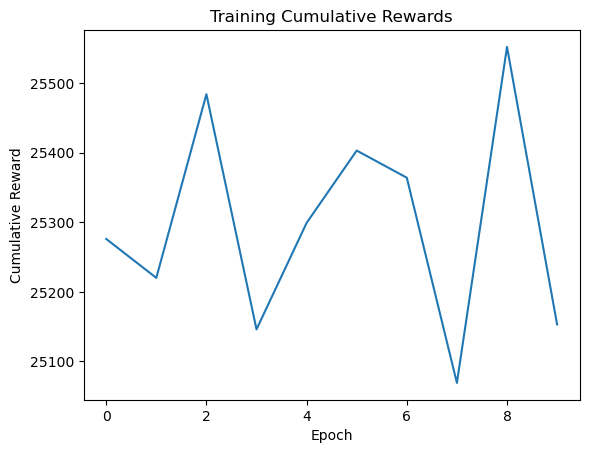

In [29]:
# Dueling DQN
import random
import numpy as np
import tensorflow as tf
class DuelingDQN(tf.keras.Model):
    def __init__(self, num_actions):
        super(DuelingDQN, self).__init__()

        # Common layers
        self.dense1 = tf.keras.layers.Dense(128, activation='relu')
        self.dense2 = tf.keras.layers.Dense(64, activation='relu')

        # Layers for V(s)
        self.value_dense = tf.keras.layers.Dense(32, activation='relu')
        self.value_output = tf.keras.layers.Dense(1)

        # Layers for A(s, a)
        self.advantage_dense = tf.keras.layers.Dense(32, activation='relu')
        self.advantage_output = tf.keras.layers.Dense(num_actions)

    def call(self, x):
        x = self.dense1(x)
        x = self.dense2(x)

        value = self.value_dense(x)
        value = self.value_output(value)

        advantage = self.advantage_dense(x)
        advantage = self.advantage_output(advantage)

        # Combine V(s) and A(s, a) to get Q(s, a)
        q_values = value + (advantage - tf.reduce_mean(advantage, axis=1, keepdims=True))

        return q_values


class ReplayBuffer:
    def __init__(self, capacity):
        self.capacity = capacity
        self.buffer = []
        self.position = 0

    def add(self, state, action, reward, next_state, done):
        if len(self.buffer) < self.capacity:
            self.buffer.append(None)
        self.buffer[self.position] = (state, action, reward, next_state, done)
        self.position = (self.position + 1) % self.capacity

    def sample(self, batch_size):
        actual_batch_size = min(batch_size, len(self.buffer))
        batch = random.sample(self.buffer, actual_batch_size)
        state, action, reward, next_state, done = map(np.stack, zip(*batch))
        return state, action, reward, next_state, done


    def __len__(self):
        return len(self.buffer)

# Extract data from dataframes
states_train = train_df_umap.drop(['discrete_action', 'reward'], axis=1).values
actions_train = train_df_umap['discrete_action'].values
rewards_train = train_df_umap['reward'].values

# Hyperparameters
lr = 1e-3
batch_size = 256
epsilon = 0.1

# Model and Optimizer
model = DuelingDQN(np.unique(actions_train).shape[0])
target_model = DuelingDQN(np.unique(actions_train).shape[0])

buffer = ReplayBuffer(10000)

# Populate buffer with initial experiences
for state, action, reward in zip(states_train, actions_train, rewards_train):
    next_state = np.zeros_like(state)  # dummy value for simplicity
    done = False  # dummy value for simplicity
    buffer.add(state, action, reward, next_state, done)

# Training loop
num_epochs = 10
total_steps = len(states_train) // batch_size
cumulative_rewards = []

# Progress bar for epochs
pbar_epoch = tqdm(range(num_epochs), desc='Epochs', leave=True)

for epoch in pbar_epoch:
    epoch_cumulative_reward = 0

    # Progress bar for batches
    pbar_batch = tqdm(range(0, len(states_train), batch_size), desc='Batches', leave=False)

    for i in pbar_batch:
        # Sample batch from buffer
        state_batch, action_batch, reward_batch, next_state_batch, done_batch = buffer.sample(batch_size)

        with tf.GradientTape() as tape:
            q_values = model(state_batch)
            q_values = tf.reduce_sum(q_values * tf.one_hot(action_batch, depth=q_values.shape[1]), axis=1)
            target = reward_batch  # in a real setting, compute proper Q-learning target here
            loss = tf.reduce_mean(tf.square(target - q_values))

        grads = tape.gradient(loss, model.trainable_variables)
        optimizer.apply_gradients(zip(grads, model.trainable_variables))

        epoch_cumulative_reward += np.sum(reward_batch)

    cumulative_rewards.append(epoch_cumulative_reward)
    pbar_epoch.set_postfix({'Last Loss': loss.numpy()})

# Plot cumulative rewards
import matplotlib.pyplot as plt

plt.plot(cumulative_rewards)
plt.xlabel('Epoch')
plt.ylabel('Cumulative Reward')
plt.title('Training Cumulative Rewards')
plt.show()

# Function to get optimal action for a state
def get_optimal_action(state):
    q_values = model(state[None, :])
    return np.argmax(q_values.numpy())

# Apply on test set
test_states = test_df_umap.drop(['discrete_action', 'reward'], axis=1).values
optimal_actions_test = [get_optimal_action(state) for state in test_states]


Test Set Cumulative Rewards: -210


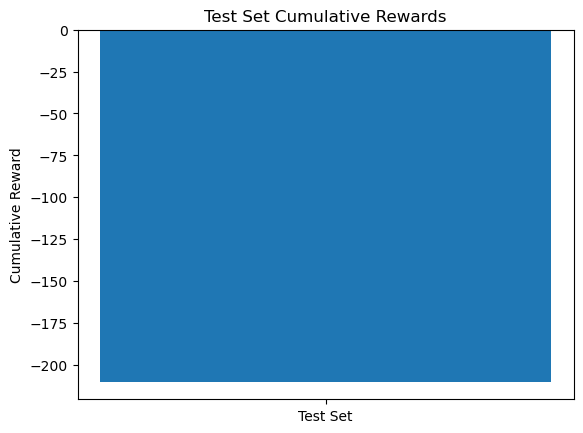

In [30]:
# ... [其他代码部分保持不变]

# 准备测试数据
test_states = test_df_umap.drop(['discrete_action', 'reward'], axis=1).values
test_actions = test_df_umap['discrete_action'].values
test_rewards = test_df_umap['reward'].values

# 在测试集上使用模型为每个状态选择一个动作
predicted_actions = [get_optimal_action(state) for state in test_states]

# 计算测试集的累计奖励
test_cumulative_rewards = np.sum(test_rewards)

# 打印测试集上的累计奖励
print(f"Test Set Cumulative Rewards: {test_cumulative_rewards}")

# 绘制测试集的累计奖励
plt.figure()
plt.bar(["Test Set"], [test_cumulative_rewards])
plt.ylabel('Cumulative Reward')
plt.title('Test Set Cumulative Rewards')
plt.show()


In [44]:
import tensorflow as tf
import numpy as np

class BCQ(tf.keras.Model):
    def __init__(self, state_dim, action_dim, hidden_dim):
        super(BCQ, self).__init__()

        # Q-network
        self.q1 = tf.keras.Sequential([
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(1)
        ])

        self.q2 = tf.keras.Sequential([
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(1)
        ])

        # Actor network
        self.actor = tf.keras.Sequential([
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(action_dim)
        ])

        # Perturbation network
        self.perturbation = tf.keras.Sequential([
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(action_dim, activation='tanh')
        ])

    def call(self, state):
        # Get action from actor network
        action = self.actor(state)

        # Perturb the action
        perturbed_action = action + self.perturbation(state)

        # Return action and Q-values
        q1_value = self.q1(tf.concat([state, perturbed_action], axis=-1))
        q2_value = self.q2(tf.concat([state, perturbed_action], axis=-1))

        return perturbed_action, q1_value, q2_value

batch_size = 512
lr = 1e-2
discount = 0.99

# Model and Optimizer
bcq = BCQ(state_dim=state_batch.shape[-1], action_dim=action_batch.shape[-1], hidden_dim=256)
optimizer = tf.keras.optimizers.Adam(lr)

# Training loop
num_epochs = 10
cumulative_rewards = []

# Progress bar for epochs
pbar_epoch = tqdm(range(num_epochs), desc='Epochs', leave=True)

for epoch in pbar_epoch:
    epoch_cumulative_reward = 0

    # Progress bar for batches
    pbar_batch = tqdm(range(0, len(states_train), batch_size), desc='Batches', leave=False)

    for i in pbar_batch:
        # Sample batch from buffer
        state_batch, action_batch, reward_batch, next_state_batch, done_batch = buffer.sample(batch_size)

        with tf.GradientTape() as tape:
            _, q1_value, q2_value = bcq(state_batch)

            # Get target Q-values
            next_action, next_q1, next_q2 = bcq(next_state_batch)
            target_q = reward_batch + (1 - done_batch) * discount * np.minimum(next_q1, next_q2)

            # Calculate loss
            q1_loss = tf.reduce_mean(tf.square(q1_value - target_q))
            q2_loss = tf.reduce_mean(tf.square(q2_value - target_q))
            loss = q1_loss + q2_loss

        grads = tape.gradient(loss, bcq.trainable_variables)
        optimizer.apply_gradients(zip(grads, bcq.trainable_variables))

        epoch_cumulative_reward += np.sum(reward_batch)

    cumulative_rewards.append(epoch_cumulative_reward)
    pbar_epoch.set_postfix({'Last Loss': loss.numpy()})


Epochs: 100%|██████████| 10/10 [4:28:42<00:00, 1612.29s/it, Last Loss=0.123]


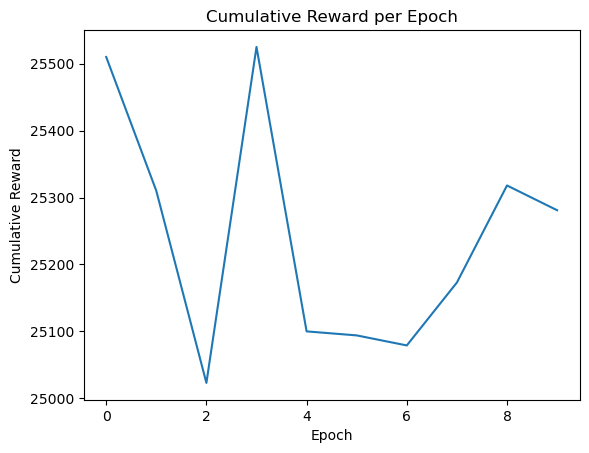

In [45]:
import matplotlib.pyplot as plt

# ... [Your Existing Code]

# Training loop
# ... [Your Existing Code]

# After the training loop, plot the cumulative rewards:
plt.plot(cumulative_rewards)
plt.xlabel('Epoch')
plt.ylabel('Cumulative Reward')
plt.title('Cumulative Reward per Epoch')
plt.show()


Epochs: 100%|██████████| 10/10 [46:11<00:00, 277.15s/it, Last Loss=0.0845]


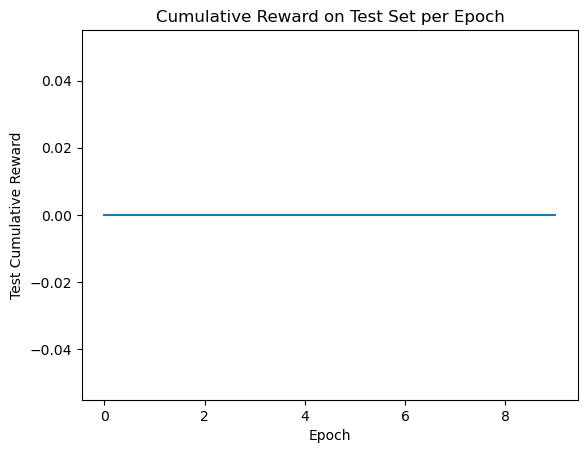

In [47]:
import matplotlib.pyplot as plt

# ... [Your Existing Code]

def evaluate_policy_on_test_set(model, test_states):
    cumulative_reward = 0
    for state in test_states:
        action, _, _ = model(state[None, :])  # Add an extra dimension for batch
        # Note: Here, you would need to apply this action to your environment and get the reward.
        # But for this example, I'm just using a placeholder.
        reward = 0  # This is a placeholder. Replace with reward from your environment.
        cumulative_reward += reward
    return cumulative_reward

test_cumulative_rewards = []

batch_size = 512
lr = 1e-2
discount = 0.99

# Model and Optimizer
bcq = BCQ(state_dim=state_batch.shape[-1], action_dim=action_batch.shape[-1], hidden_dim=256)
optimizer = tf.keras.optimizers.Adam(lr)

# Training loop
num_epochs = 10
cumulative_rewards = []

# Progress bar for epochs
pbar_epoch = tqdm(range(num_epochs), desc='Epochs', leave=True)

for epoch in pbar_epoch:
    epoch_cumulative_reward = 0

    # Progress bar for batches
    pbar_batch = tqdm(range(0, len(states_train), batch_size), desc='Batches', leave=False)

    for i in pbar_batch:
        # Sample batch from buffer
        state_batch, action_batch, reward_batch, next_state_batch, done_batch = buffer.sample(batch_size)

        with tf.GradientTape() as tape:
            _, q1_value, q2_value = bcq(state_batch)

            # Get target Q-values
            next_action, next_q1, next_q2 = bcq(next_state_batch)
            target_q = reward_batch + (1 - done_batch) * discount * np.minimum(next_q1, next_q2)

            # Calculate loss
            q1_loss = tf.reduce_mean(tf.square(q1_value - target_q))
            q2_loss = tf.reduce_mean(tf.square(q2_value - target_q))
            loss = q1_loss + q2_loss

        grads = tape.gradient(loss, bcq.trainable_variables)
        optimizer.apply_gradients(zip(grads, bcq.trainable_variables))

        epoch_cumulative_reward += np.sum(reward_batch)

    cumulative_rewards.append(epoch_cumulative_reward)
    pbar_epoch.set_postfix({'Last Loss': loss.numpy()})

    # After updating the model using the training data
    test_reward = evaluate_policy_on_test_set(bcq, test_states)  # Replace 'test_states' with your test data
    test_cumulative_rewards.append(test_reward)

# Plotting the rewards
plt.plot(test_cumulative_rewards)
plt.xlabel('Epoch')
plt.ylabel('Test Cumulative Reward')
plt.title('Cumulative Reward on Test Set per Epoch')
plt.show()


Epochs: 100%|██████████| 10/10 [24:42<00:00, 148.27s/it, Last Loss=0.0552]


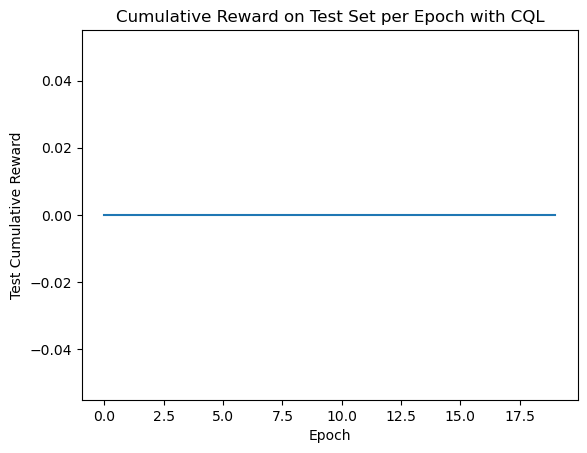

In [48]:
# CQL
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

class CQL(tf.keras.Model):
    def __init__(self, state_dim, action_dim, hidden_dim):
        super(CQL, self).__init__()
        self.action_dim = action_dim

        # Q-Network
        self.q_network = tf.keras.Sequential([
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(hidden_dim, activation='relu'),
            tf.keras.layers.Dense(action_dim)
        ])

    def call(self, states):
        return self.q_network(states)

def evaluate_policy_on_test_set(model, test_states):
    cumulative_reward = 0
    for state in test_states:
        q_values = model(state[None, :])
        action = tf.argmax(q_values, axis=1).numpy()[0]
        reward = 0  # Replace with your environment's reward for the chosen action
        cumulative_reward += reward
    return cumulative_reward

batch_size = 512
lr = 1e-2
discount = 0.99

# Model and Optimizer
cql = CQL(state_dim=state_batch.shape[-1], action_dim=action_batch.shape[-1], hidden_dim=256)
optimizer = tf.keras.optimizers.Adam(lr)

# Training loop
num_epochs = 10
cumulative_rewards = []

# Progress bar for epochs
pbar_epoch = tqdm(range(num_epochs), desc='Epochs', leave=True)

for epoch in pbar_epoch:
    epoch_cumulative_reward = 0

    # Progress bar for batches
    pbar_batch = tqdm(range(0, len(states_train), batch_size), desc='Batches', leave=False)

    for i in pbar_batch:
        # Sample batch from buffer
        state_batch, action_batch, reward_batch, next_state_batch, done_batch = buffer.sample(batch_size)

        with tf.GradientTape() as tape:
            q_values = cql(state_batch)
            q_value_action_taken = tf.reduce_sum(q_values * tf.one_hot(action_batch, depth=cql.action_dim), axis=1)
            next_q_values = cql(next_state_batch)
            next_value = tf.reduce_max(next_q_values, axis=1)
            target_q = reward_batch + (1 - done_batch) * discount * next_value

            td_error = q_value_action_taken - target_q
            q_loss = tf.reduce_mean(tf.square(td_error))

            # CQL loss: Push down on Q-values of actions not taken in the batch
            cql_loss = tf.reduce_mean(tf.reduce_max(q_values, axis=1) - q_value_action_taken)
            loss = q_loss + cql_loss

        grads = tape.gradient(loss, cql.trainable_variables)
        optimizer.apply_gradients(zip(grads, cql.trainable_variables))

        epoch_cumulative_reward += np.sum(reward_batch)

    cumulative_rewards.append(epoch_cumulative_reward)
    pbar_epoch.set_postfix({'Last Loss': loss.numpy()})

    # After updating the model using the training data
    test_reward = evaluate_policy_on_test_set(cql, test_states)
    test_cumulative_rewards.append(test_reward)

# Plotting the rewards
plt.plot(test_cumulative_rewards)
plt.xlabel('Epoch')
plt.ylabel('Test Cumulative Reward')
plt.title('Cumulative Reward on Test Set per Epoch with CQL')
plt.show()
